In [1]:
import numpy as np
import matplotlib.pyplot as plt
import timeit

In [2]:
%%time
def decompose_position(size,wavelength=1e-6):
    
    OF = 1
    wo = 300*wavelength
    
    nbeams = int(size*OF/(2*wo))
    x = np.linspace(-size/2,size/2,nbeams)
    x,y = np.meshgrid(x,x)
    x = np.concatenate(x).flatten('F')
    y = np.concatenate(y).flatten('F')
    
    return x,y,wo,wavelength

x,y,wo,wav = decompose_position(25e-3)

Wall time: 0 ns


In [3]:
%%time
def make_rays(x,y,wo,wlen):
    
    div = wlen/(np.pi*wo)
    
    base = np.array([x,
                      y,
                      x*0,
                      y*0])
    
    waisty = np.array([x,
                       y+wo,
                       x*0,
                       y*0])
    
    waistx = np.array([x+wo,
                       y,
                       x*0,
                       y*0])
    
    divy   = np.array([x,
                       y,
                       x*0,
                       y*0+div])
    
    divx   = np.array([x,
                       y,
                       x*0+div,
                       y*0])
    
    return base,waisty,waistx,divy,divx

bs,wy,wx,dy,dx = make_rays(x,y,wo,wav)

Wall time: 0 ns


In [4]:
%%time
def make_osys():
    return np.array([[1.,0,0,0],
                     [0,1.,0,0],
                     [0,0,1.,0],
                     [0,0,0,1.]])

def add_optic(efl,osys):
    return np.matmul(np.array([[1.,0,0,0],
                               [0,1.,0,0],
                               [-1/efl,0,1.,0],
                               [0,-1/efl,0,1.]]),osys)
def add_distance(distance,osys):
    return np.matmul(np.array([[1.,0,distance,0],
                               [0,1.,0,distance],
                               [0,0,1.,0],
                               [0,0,0,1.]]),osys)

def prop_ray(rayset,osys):
    return np.matmul(osys,rayset)

dist = 10*25e-3
efl  = 5*25e-3

osys = make_osys()
osys = add_optic(efl,osys)
osys = add_distance(dist,osys)
bsp = prop_ray(bs,osys)
wyp = prop_ray(wy,osys)
wxp = prop_ray(wx,osys)
dyp = prop_ray(dy,osys)
dxp = prop_ray(dx,osys)

def get_opl(rayin,rayout,distance):
    return np.sqrt((rayout[0]-rayin[0])**2 + (rayout[1]-rayin[1])**2 + distance**2)

# wy_opl = get_opl(wy,wyp,dist)
# wx_opl = get_opl(wx,wxp,dist)
# dy_opl = get_opl(dy,dyp,dist)
# dx_opl = get_opl(dx,dxp,dist)   

bs_opl = get_opl(bs,bsp,dist)

def make_complex_rays(wy,wx,dy,dx):
    h1 = dy[:2] + 1j*wy[:2]
    u1 = dy[2:] + 1j*wy[2:]
    h2 = dx[:2] + 1j*wx[:2]
    u2 = dx[2:] + 1j*wx[2:]
    return h1,u1,h2,u2

h1,u1,h2,u2 = make_complex_rays(wyp,wxp,dyp,dxp)

Wall time: 0 ns


In [5]:
%%time
def gaussian_phase_from_rays(h1,u1,h2,u2,opl):
    pbox = np.zeros([h1.shape[1],256*256],dtype='complex128')
    abox = np.zeros([h1.shape[1],256*256],dtype='complex128')
    x = np.linspace(-25e-3,25e-3,256)
    x,y = np.meshgrid(x,x)
    x = np.ravel(x)
    y = np.ravel(y)
    r = np.array([x,y])
    
    for i in range(h1.shape[1]):
        
        h1r = np.cross(h1[:,i],np.transpose(r))
        u1r = np.dot(u1[:,i],r)
        h2r = np.cross(h2[:,i],np.transpose(r))
        u2r = np.dot(u2[:,i],r)
        h1h2 = np.cross(h1[:,i],h2[:,i])

        phase = 1j*2*np.pi/1e-6 *((h1r*u2r-h2r*u1r)/(2*h1h2))
        phase += -np.pi*(np.abs(h1r)**2 + np.abs(h2r)**2)/h1h2**2
        phase += opl[i]
        pbox[i] = phase
        abox[i] += np.sqrt(1e-6/(h1.shape[1]*h1h2))
    
    return pbox,abox

phase,amp = gaussian_phase_from_rays(h1,u1,h2,u2,bs_opl)

phasor = np.sum(amp*np.exp(phase),axis=0)
phasor = np.reshape(phasor,[256,256])

c:\users\jaren\miniconda3\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: overflow encountered in exp
c:\users\jaren\miniconda3\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: invalid value encountered in multiply
c:\users\jaren\miniconda3\lib\site-packages\numpy\core\fromnumeric.py:90: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


Wall time: 50.1 s


In [ ]:
all_data = np.reshape(amp[0]*np.exp(phase[0]),[256,256])
all_data.shape

total frames =  1681


c:\users\jaren\miniconda3\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning: overflow encountered in exp
  if __name__ == '__main__':
c:\users\jaren\miniconda3\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in multiply
  if __name__ == '__main__':


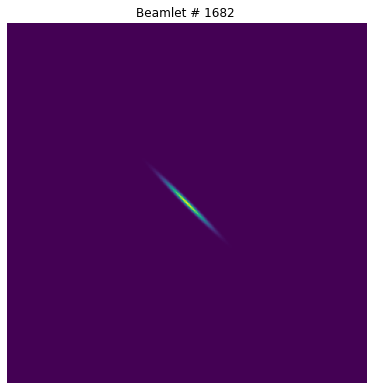

In [6]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation
matplotlib.rcParams['animation.embed_limit'] = 2*32
total_number_of_frames = phase.shape[0]
print('total frames = ',total_number_of_frames)
all_data = np.abs(amp*np.exp(phase))
# print(all_data.shape)
# all_data = all_data[0]
# print(all_data.shape)
k = 0
def animate(frame):
    global all_data,image,k
    
    k += 1
    
    image.set_array(np.reshape(all_data[frame],[256,256]))
    ax.set_title('Beamlet # {} '.format(k))
    return image

fig,ax = plt.subplots(1,figsize=[5,5])
fig.subplots_adjust(0,0,1,1)
ax.axis("off")
image = ax.imshow(np.reshape(all_data[0],[256,256]))

ani = FuncAnimation(fig,animate,np.arange(total_number_of_frames-1),fargs=[],interval=120)
Writer = animation.PillowWriter
writer = Writer(fps=15,metadata=dict(artist='Jaren'),bitrate=1800)

from IPython.display import HTML
HTML(ani.to_jshtml())


In [ ]:
cut = 128
plt.imshow(np.abs(phasor[int(phasor.shape[0]/2)-cut:int(phasor.shape[0]/2)+cut,int(phasor.shape[0]/2)-cut:int(phasor.shape[0]/2)+cut]))
plt.colorbar()

In [ ]:
plt.imshow(np.angle(phasor))
plt.colorbar()